In [62]:
! pip install pandas_profiling

In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import scipy.stats as stats
import pandas_profiling

%matplotlib inline
plt.rcParams['figure.figsize'] = 10, 7.5
plt.rcParams['axes.grid'] = True

from matplotlib.backends.backend_pdf import PdfPages

In [64]:
from sklearn.cluster import KMeans

# center and scale the data
from sklearn.preprocessing import StandardScaler

In [65]:
from sklearn.decomposition import PCA

In [66]:
# reading data into dataframe
telco= pd.read_csv("telcom_80.csv")
telco.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [67]:
telco.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [68]:
telco.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,437.438860,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,42.521018,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,408.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,408.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,415.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,510.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [8]:
#Detailed profiling using pandas profiling

pandas_profiling.ProfileReport(telco)

In [9]:
## Exporting pandas profiling output to html file

output = pandas_profiling.ProfileReport(telco)

output.to_file(output_file='pandas_profiling.html')


In [69]:
numeric_var_names=[key for key in dict(telco.dtypes) if dict(telco.dtypes)[key] in ['float64', 'int64', 'float32', 'int32']]
cat_var_names=[key for key in dict(telco.dtypes) if dict(telco.dtypes)[key] in ['object']]
print(numeric_var_names)
print(cat_var_names)

['Account length', 'Area code', 'Number vmail messages', 'Total day minutes', 'Total day calls', 'Total day charge', 'Total eve minutes', 'Total eve calls', 'Total eve charge', 'Total night minutes', 'Total night calls', 'Total night charge', 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls']
['State', 'International plan', 'Voice mail plan']


In [70]:
telco_num=telco[numeric_var_names]
telco_num.head(5)


,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
0,128,415,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,107,415,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
2,137,415,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
3,84,408,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
4,75,415,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3


In [71]:
# Creating Data audit Report
# Use a general function that returns multiple values
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  x.std(), x.var(), x.min(), x.dropna().quantile(0.01), x.dropna().quantile(0.05),x.dropna().quantile(0.10),x.dropna().quantile(0.25),x.dropna().quantile(0.50),x.dropna().quantile(0.75), x.dropna().quantile(0.90),x.dropna().quantile(0.95), x.dropna().quantile(0.99),x.max()], 
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1' , 'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

num_summary=telco_num.apply(lambda x: var_summary(x)).T

In [72]:
num_summary

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
Account length,2666.0,0.0,268254.00,100.620405,100.00,39.563974,1565.308011,1.00,12.6500,36.0000,50.000,73.0000,100.00,127.000,151.000,166.0000,193.0000,243.00
Area code,2666.0,0.0,1166212.00,437.438860,415.00,42.521018,1808.036973,408.00,408.0000,408.0000,408.000,408.0000,415.00,510.000,510.000,510.0000,510.0000,510.00
Number vmail messages,2666.0,0.0,21386.00,8.021755,0.00,13.612277,185.294086,0.00,0.0000,0.0000,0.000,0.0000,0.00,19.000,32.000,36.0000,43.0000,50.00
Total day minutes,2666.0,0.0,478498.00,179.481620,179.95,54.210350,2938.762071,0.00,50.9250,90.4250,110.400,143.4000,179.95,215.900,248.850,269.7750,302.8750,350.80
Total day calls,2666.0,0.0,267427.00,100.310203,101.00,19.988162,399.526628,0.00,54.0000,67.0000,74.500,87.0000,101.00,114.000,125.000,133.0000,146.3500,160.00
Total day charge,2666.0,0.0,81346.07,30.512404,30.59,9.215733,84.929733,0.00,8.6585,15.3750,18.770,24.3800,30.59,36.700,42.305,45.8650,51.4880,59.64
Total eve minutes,2666.0,0.0,534229.50,200.386159,200.90,50.951515,2596.056893,0.00,80.3900,118.7250,135.950,165.3000,200.90,235.100,265.800,285.0250,318.8700,363.70
Total eve calls,2666.0,0.0,266663.00,100.023631,100.00,20.161445,406.483869,0.00,53.0000,67.0000,74.000,87.0000,100.00,114.000,125.000,133.0000,147.0000,170.00
Total eve charge,2666.0,0.0,45410.17,17.033072,17.08,4.330864,18.756385,0.00,6.8325,10.0925,11.555,14.0500,17.08,19.980,22.590,24.2250,27.1070,30.91
Total night minutes,2666.0,0.0,536316.40,201.168942,201.15,50.780323,2578.641241,43.70,80.0950,117.9250,136.550,166.9250,201.15,236.475,264.750,283.6750,319.1400,395.00


In [73]:
#Handling missings 
def Missing_imputation(x):
    x = x.fillna(x.median())
    return x

telco_num=telco_num.apply(lambda x: Missing_imputation(x))

In [74]:
telco_num.corr()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
Account length,1.000000,-0.008620,-0.002996,0.002847,0.038862,0.002843,-0.015923,0.018552,-0.015909,-0.008994,-0.024007,-0.008999,0.011369,0.017627,0.011383,0.002455
Area code,-0.008620,1.000000,-0.000584,-0.023134,-0.009629,-0.023130,0.000679,-0.018602,0.000707,-0.003353,0.011455,-0.003382,-0.013418,-0.027423,-0.013534,0.034442
Number vmail messages,-0.002996,-0.000584,1.000000,0.019027,-0.009622,0.019027,0.011401,0.005131,0.011418,-0.000224,0.008124,-0.000229,-0.004156,0.027013,-0.004136,-0.018787
Total day minutes,0.002847,-0.023134,0.019027,1.000000,0.016780,1.000000,0.003999,0.009059,0.003992,0.013491,0.015054,0.013464,-0.011042,0.005687,-0.010934,-0.024543
Total day calls,0.038862,-0.009629,-0.009622,0.016780,1.000000,0.016787,-0.026003,0.006473,-0.026006,0.008986,-0.016776,0.008972,0.031036,0.006928,0.031133,-0.011945
Total day charge,0.002843,-0.023130,0.019027,1.000000,0.016787,1.000000,0.004008,0.009056,0.004002,0.013495,0.015057,0.013468,-0.011046,0.005688,-0.010938,-0.024548
Total eve minutes,-0.015923,0.000679,0.011401,0.003999,-0.026003,0.004008,1.000000,-0.007654,1.000000,-0.013414,0.009017,-0.013450,-0.006915,0.002160,-0.006947,-0.013192
Total eve calls,0.018552,-0.018602,0.005131,0.009059,0.006473,0.009056,-0.007654,1.000000,-0.007642,-0.000175,0.000797,-0.000135,0.011012,0.003710,0.011000,0.001058
Total eve charge,-0.015909,0.000707,0.011418,0.003992,-0.026006,0.004002,1.000000,-0.007642,1.000000,-0.013428,0.009030,-0.013464,-0.006923,0.002169,-0.006955,-0.013196
Total night minutes,-0.008994,-0.003353,-0.000224,0.013491,0.008986,0.013495,-0.013414,-0.000175,-0.013428,1.000000,0.012736,0.999999,-0.008607,-0.001110,-0.008510,0.005236


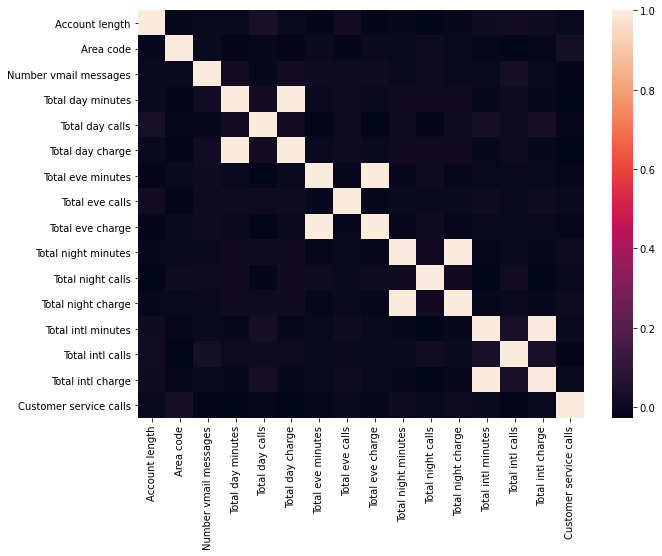

In [75]:
# visualize correlation matrix in Seaborn using a heatmap
sns.heatmap(telco_num.corr())

In [76]:
#standardizing data
telco_num.columns

Index(['Account length', 'Area code', 'Number vmail messages',
       'Total day minutes', 'Total day calls', 'Total day charge',
       'Total eve minutes', 'Total eve calls', 'Total eve charge',
       'Total night minutes', 'Total night calls', 'Total night charge',
       'Total intl minutes', 'Total intl calls', 'Total intl charge',
       'Customer service calls'],
      dtype='object')

In [77]:
sc=StandardScaler()

telco_scaled=sc.fit_transform(telco_num)

In [78]:
pd.DataFrame(telco_scaled).head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0.692163,-0.527811,1.247508,1.579670,0.484868,1.579942,-0.058619,-0.050781,-0.058445,0.857403,-0.469031,0.856707,-0.085020,-0.597527,-0.085681,-0.429172
1,0.161278,-0.527811,1.320985,-0.329918,1.135375,-0.330194,-0.095916,0.147654,-0.095397,1.048458,0.149054,1.049293,1.242179,-0.597527,1.242921,-0.429172
2,0.919686,-0.527811,-0.589414,1.179302,0.685024,1.179465,-1.554439,0.494917,-1.554963,-0.759668,0.200561,-0.758391,0.704125,0.216894,0.698194,-1.191955
3,-0.420168,-0.692467,-0.589414,2.212509,-1.466653,2.212675,-2.718509,-0.596479,-2.718922,-0.084083,-0.572045,-0.084339,-1.304609,1.031314,-1.307995,0.333610
4,-0.647691,-0.527811,-0.589414,-0.235822,0.634985,-0.235772,-1.022461,1.090224,-1.021482,-0.281046,1.076181,-0.281303,-0.049150,-0.597527,-0.045823,1.096392


In [79]:
pd.DataFrame(telco_scaled).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
count,2.666000e+03,2.666000e+03,2.666000e+03,2.666000e+03,2.666000e+03,2.666000e+03,2.666000e+03,2.666000e+03,2.666000e+03,2.666000e+03,2.666000e+03,2.666000e+03,2.666000e+03,2.666000e+03,2.666000e+03,2.666000e+03
mean,-1.310113e-16,-8.672732e-16,-3.586362e-16,1.724885e-16,2.273750e-16,-1.923942e-16,-1.179352e-16,3.275699e-16,2.915897e-16,5.654392e-16,-5.730183e-17,-2.760149e-16,-2.013893e-16,-2.946297e-18,5.267937e-16,4.839007e-17
std,1.000188e+00,1.000188e+00,1.000188e+00,1.000188e+00,1.000188e+00,1.000188e+00,1.000188e+00,1.000188e+00,1.000188e+00,1.000188e+00,1.000188e+00,1.000188e+00,1.000188e+00,1.000188e+00,1.000188e+00,1.000188e+00
min,-2.518430e+00,-6.924665e-01,-5.894135e-01,-3.311458e+00,-5.019422e+00,-3.311525e+00,-3.933617e+00,-4.962065e+00,-3.933688e+00,-3.101565e+00,-3.456440e+00,-3.100065e+00,-3.672045e+00,-1.819157e+00,-3.672907e+00,-1.191955e+00
25%,-6.982511e-01,-6.924665e-01,-5.894135e-01,-6.657103e-01,-6.660292e-01,-6.655526e-01,-6.887477e-01,-6.460883e-01,-6.889229e-01,-6.744811e-01,-6.750593e-01,-6.741347e-01,-6.230740e-01,-5.975267e-01,-6.171222e-01,-4.291724e-01
50%,-1.568400e-02,-5.278112e-01,-5.894135e-01,8.641661e-03,3.451677e-02,8.421490e-03,1.008679e-02,-1.172304e-03,1.083774e-02,-3.730931e-04,-5.467553e-03,-1.177149e-03,-1.327980e-02,-1.903165e-01,-1.925127e-02,-4.291724e-01
75%,6.668831e-01,1.706797e+00,8.066471e-01,6.719236e-01,6.850237e-01,6.715425e-01,6.814391e-01,6.933526e-01,6.805757e-01,6.954009e-01,6.641242e-01,6.947594e-01,6.682549e-01,6.241038e-01,6.716218e-01,3.336100e-01
max,3.599393e+00,1.706797e+00,3.084430e+00,3.160845e+00,2.986818e+00,3.161231e+00,3.205881e+00,3.471452e+00,3.204795e+00,3.817767e+00,3.393998e+00,3.815532e+00,3.502005e+00,6.325047e+00,3.501544e+00,5.673087e+00


In [80]:
#applying PCA 
pc = PCA(n_components=16)

In [81]:
pc.fit(telco_scaled)

PCA(n_components=16)

In [82]:
pc.explained_variance_

array([2.04820100e+00, 2.02757682e+00, 1.98482315e+00, 1.95739765e+00,
       1.07391196e+00, 1.05361379e+00, 1.00467064e+00, 9.99358642e-01,
       9.88901837e-01, 9.74332239e-01, 9.51684212e-01, 9.41523440e-01,
       7.32343641e-06, 7.72362517e-07, 2.17952195e-07, 4.80352098e-08])

In [83]:
#Eigen values
sum(pc.explained_variance_)

16.00600375234523

In [84]:
#The amount of variance that each PC explains
var= pc.explained_variance_ratio_

In [85]:
var

array([1.27964546e-01, 1.26676018e-01, 1.24004916e-01, 1.22291465e-01,
       6.70943216e-02, 6.58261617e-02, 6.27683622e-02, 6.24364868e-02,
       6.17831816e-02, 6.08729233e-02, 5.94579526e-02, 5.88231426e-02,
       4.57543089e-07, 4.82545506e-08, 1.36169026e-08, 3.00107450e-09])

In [86]:
#Cumulative Variance explains
var1=np.cumsum(np.round(pc.explained_variance_ratio_, decimals=4)*100)

In [87]:
var1

array([ 12.8 ,  25.47,  37.87,  50.1 ,  56.81,  63.39,  69.67,  75.91,
        82.09,  88.18,  94.13, 100.01, 100.01, 100.01, 100.01, 100.01])

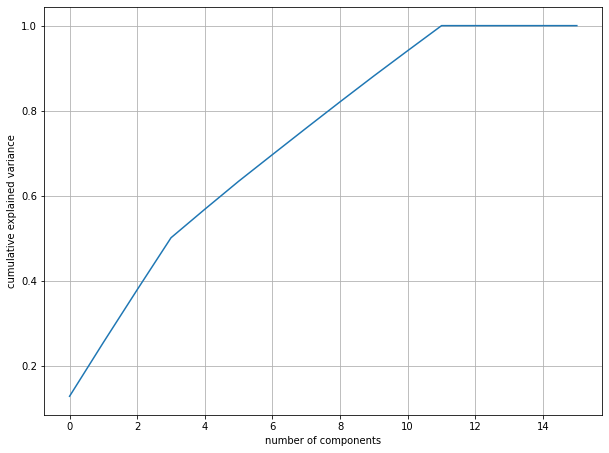

In [88]:
plt.plot(np.cumsum(pc.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [89]:
#number of components have choosen as 9 based on cumulative variacne is explaining >75 % and individual component explaining >0.8 variance
pc_final=PCA(n_components=8).fit(telco_scaled)

In [90]:
pc_final.explained_variance_

array([2.048201  , 2.02757682, 1.98482315, 1.95739765, 1.07391196,
       1.05361379, 1.00467064, 0.99935864])

In [91]:
reduced_cr=pc_final.fit_transform(telco_scaled)  # the out put is Factors (F1, F2, ...F8)

In [92]:
dimensions = pd.DataFrame(reduced_cr)

In [93]:
dimensions.columns = ["C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8"]

In [94]:
dimensions.head()

,C1,C2,C3,C4,C5,C6,C7,C8
0,-2.155864,0.286061,-1.407828,0.123693,0.774941,-0.350984,-0.085901,0.328391
1,0.303255,1.522798,-0.849194,-1.560464,0.828559,0.044112,0.015572,0.292693
2,0.038500,1.534313,-1.551013,2.362308,1.225478,-0.367174,-0.320025,-0.153963
3,-2.947438,1.870693,-0.053218,3.879560,-0.315577,0.707859,-0.686975,-0.397250
4,0.294037,1.032787,0.573524,0.976306,-0.448028,-0.191912,0.619613,-1.265857


In [95]:
#Loading Matrix
#Loadings=Eigenvectors * sqrt(Eigenvalues)
#loadings are the covariances/correlations between the original variables and the unit-scaled components.

#pc_final.components_
#print pd.DataFrame(pc_final.components_,columns=telco_num.columns).T
Loadings =  pd.DataFrame((pc_final.components_.T * np.sqrt(pc_final.explained_variance_)).T,columns=telco_num.columns).T

In [96]:
Loadings.to_csv("Loadings.csv")

In [97]:
#CLUSTERING

#selected the list variables from PCA based on factor loading matrics
list_var = ['Total day minutes','Total day charge','Total eve minutes','Total eve charge','Total night minutes','Total night charge','Total intl minutes','Total intl charge']

In [98]:
telco_scaled1=pd.DataFrame(telco_scaled, columns=telco_num.columns)
telco_scaled1.head(5)

telco_scaled2=telco_scaled1[list_var]
telco_scaled2.head(5)

,Total day minutes,Total day charge,Total eve minutes,Total eve charge,Total night minutes,Total night charge,Total intl minutes,Total intl charge
0,1.579670,1.579942,-0.058619,-0.058445,0.857403,0.856707,-0.085020,-0.085681
1,-0.329918,-0.330194,-0.095916,-0.095397,1.048458,1.049293,1.242179,1.242921
2,1.179302,1.179465,-1.554439,-1.554963,-0.759668,-0.758391,0.704125,0.698194
3,2.212509,2.212675,-2.718509,-2.718922,-0.084083,-0.084339,-1.304609,-1.307995
4,-0.235822,-0.235772,-1.022461,-1.021482,-0.281046,-0.281303,-0.049150,-0.045823


In [99]:
#SEGMENTATION
km_3=KMeans(n_clusters=3,random_state=123)

In [100]:
km_3.fit(telco_scaled2)
#km_3.labels_

KMeans(n_clusters=3, random_state=123)

In [101]:
km_3.labels_

array([0, 0, 2, ..., 2, 1, 0])

In [102]:
km_3.cluster_centers_

array([[ 0.21533396,  0.2153402 , -0.0611591 , -0.06118397,  0.96607216,
         0.96608912,  0.21260377,  0.21266171],
       [-0.24487112, -0.24486708,  0.89583203,  0.8958369 , -0.50025412,
        -0.50029333,  0.08779442,  0.08775424],
       [ 0.01777944,  0.01776811, -0.88476982, -0.88474695, -0.55726235,
        -0.55723974, -0.33331975, -0.33334233]])

In [103]:
km_4=KMeans(n_clusters=4,random_state=123).fit(telco_scaled2)
km_4.labels_

km_5=KMeans(n_clusters=5,random_state=123).fit(telco_scaled2)
km_5.labels_

km_6=KMeans(n_clusters=6,random_state=123).fit(telco_scaled2)
km_6.labels_

km_7=KMeans(n_clusters=7,random_state=123).fit(telco_scaled2)
km_7.labels_

km_8=KMeans(n_clusters=8,random_state=123).fit(telco_scaled2)
km_5.labels_

array([3, 0, 2, ..., 2, 1, 3])

In [104]:
# Conactenating labels found through Kmeans with data 
#cluster_df_4=pd.concat([telco_num,pd.Series(km_4.labels_,name='Cluster_4')],axis=1)

# save the cluster labels and sort by cluster
telco_num['cluster_3'] = km_3.labels_
telco_num['cluster_4'] = km_4.labels_
telco_num['cluster_5'] = km_5.labels_
telco_num['cluster_6'] = km_6.labels_
telco_num['cluster_7'] = km_7.labels_
telco_num['cluster_8'] = km_8.labels_

In [105]:
telco_num.head(5)

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,...,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8
0,128,415,25,265.1,110,45.07,197.4,99,16.78,244.7,...,10.0,3,2.70,1,0,3,3,1,0,4
1,107,415,26,161.6,123,27.47,195.5,103,16.62,254.4,...,13.7,3,3.70,1,0,3,0,5,3,6
2,137,415,0,243.4,114,41.38,121.2,110,10.30,162.6,...,12.2,5,3.29,0,2,2,2,0,1,7
3,84,408,0,299.4,71,50.90,61.9,88,5.26,196.9,...,6.6,7,1.78,2,2,2,2,0,0,7
4,75,415,0,166.7,113,28.34,148.3,122,12.61,186.9,...,10.1,3,2.73,3,2,1,2,2,1,7


In [106]:
pd.Series(km_3.labels_).value_counts()/sum(pd.Series(km_3.labels_).value_counts())

0    0.352588
1    0.334959
2    0.312453
dtype: float64

In [107]:
pd.Series(km_6.labels_).value_counts()/sum(pd.Series(km_6.labels_).value_counts())

5    0.184546
4    0.176669
1    0.170668
2    0.158665
3    0.155289
0    0.154164
dtype: float64

In [108]:
#CHOOSING NUMBER OF CLUSTERS USING SILHOUETTE COEFFICIENT
# calculate SC for K=3
from sklearn import metrics
metrics.silhouette_score(telco_scaled2, km_8.labels_)

0.17353696457327875

In [109]:
# calculate SC for K=3 through K=12
k_range = range(3, 9)
scores = []
for k in k_range:
    km = KMeans(n_clusters=k, random_state=123)
    km.fit(telco_scaled2)
    scores.append(metrics.silhouette_score(telco_scaled2, km.labels_))

In [110]:
scores

[0.1615014786591127,
 0.16626051373844947,
 0.1741272248041315,
 0.1624143650268075,
 0.16910683149977418,
 0.17353696457327875]

In [111]:
#the highest score is 0.1741 ie. 5 clusters would be the optimum solution

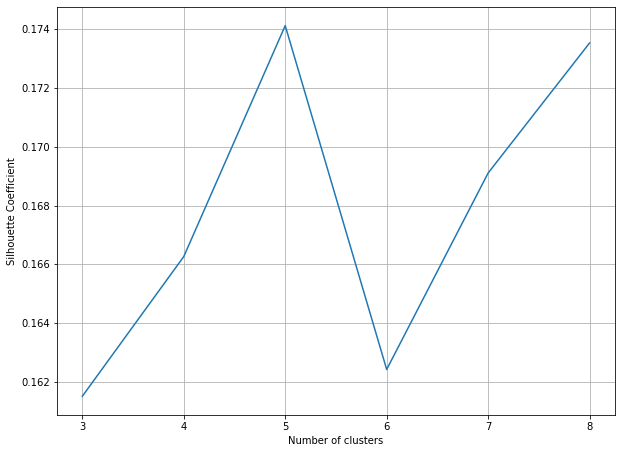

In [112]:
# plot the results
plt.plot(k_range, scores)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Coefficient')
plt.grid(True)

In [113]:
# 5 Clusters is the best solution

In [114]:
#ELBOW ANALYSIS TO FIND THE OPTIMUM NUMBER OF CLUSTERS
cluster_range = range( 1, 20 )
cluster_errors = []

for num_clusters in cluster_range:
    clusters = KMeans( num_clusters )
    clusters.fit( telco_scaled2 )
    cluster_errors.append( clusters.inertia_ )

In [115]:
clusters_df = pd.DataFrame( { "num_clusters":cluster_range, "cluster_errors": cluster_errors } )

clusters_df[0:10]

,num_clusters,cluster_errors
0,1,21328.000000
1,2,17836.429071
2,3,15377.228414
3,4,13536.700728
4,5,11993.902097
5,6,11237.824248
6,7,10427.228186
7,8,9721.744947
8,9,9272.591177
9,10,8842.415238


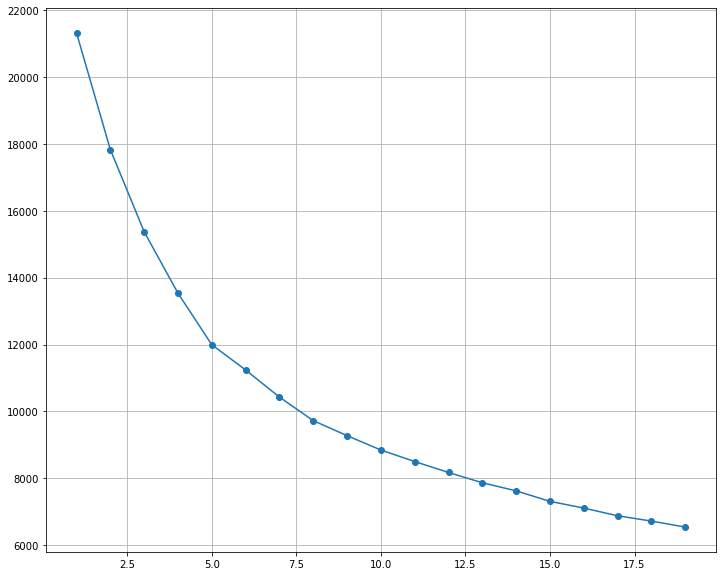

In [116]:
# allow plots to appear in the notebook
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(figsize=(12,10))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )

In [117]:
#The elbow diagram shows that the gain in explained variance reduces significantly from 3 to 5. So, optimal number of clusters could either 4 or 5.
#The actual number of clusters chosen can be finally based on business context and convenience of dealing with number of segments or clusters.

In [ ]:
#BIRCH
mport numpy as np 
import pandas as pd 
import os
df=pd.read_csv('churn-bigml-80.csv')
test=pd.read_csv('churn-bigml-20.csv')

import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_blobs
from sklearn.cluster import AffinityPropagation

In [ ]:
data=df.iloc[:,8:15].values
data_col=df.iloc[:,8:15]

In [ ]:
#SCALE DATA
from sklearn.preprocessing import normalize
data_scaled = normalize(data)
data_scaled = pd.DataFrame(data_scaled, columns=df.iloc[:,8:15].columns)
data_scaled.head()

In [ ]:
#BIRCH MODEL
# birch clustering
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import Birch
from matplotlib import pyplot

In [ ]:
#FOR 5 CLUSTERS
model = Birch(threshold=0.01, n_clusters=5)
model.fit(data_scaled)

In [ ]:
# assign a cluster to each example
yhat = model.predict(data)
# retrieve unique clusters
clusters = unique(yhat)
# create scatter plot for samples from each cluster
for cluster in clusters:
	# get row indexes for samples with this cluster
	row_ix = where(yhat == cluster)
	# create scatter of these samples
	pyplot.scatter(data[row_ix, 0], data[row_ix, 1])
# show the plot
pyplot.show()

In [ ]:
#FOR 4 CLUSTERS

model = Birch(threshold=0.01, n_clusters=4)
model.fit(data_scaled)

# assign a cluster to each example
yhat = model.predict(data)
# retrieve unique clusters
clusters = unique(yhat)
# create scatter plot for samples from each cluster
for cluster in clusters:
	# get row indexes for samples with this cluster
	row_ix = where(yhat == cluster)
	# create scatter of these samples
	pyplot.scatter(data[row_ix, 0], data[row_ix, 1])
# show the plot
pyplot.show()

In [ ]:
#MEANSHIFT ALGO
from sklearn.cluster import MeanShift
model = MeanShift()

In [ ]:
yhat = model.fit_predict(data)
# retrieve unique clusters
clusters = unique(yhat)
# create scatter plot for samples from each cluster
for cluster in clusters:
	# get row indexes for samples with this cluster
	row_ix = where(yhat == cluster)
	# create scatter of these samples
	pyplot.scatter(data[row_ix, 0], data[row_ix, 1])
# show the plot
pyplot.show()

In [ ]:
#hierarchical 
import numpy as np 
import pandas as pd 
import os
df=pd.read_csv('churn-bigml-80.csv')
test=pd.read_csv('churn-bigml-20.csv')

In [ ]:
#CORRELATION
import numpy as np
import seaborn as sns; 
ax = sns.heatmap(df.corr(), cmap="YlGnBu")

In [ ]:
data=df.iloc[:,8:15].values
data_col=df.iloc[:,8:15]
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline

import numpy as np
import scipy.cluster.hierarchy as shc

In [ ]:
#SCALE DATA
from sklearn.preprocessing import normalize
data_scaled = normalize(data)
data_scaled = pd.DataFrame(data_scaled, columns=df.iloc[:,8:15].columns)
data_scaled.head()

In [ ]:
#FACTOR PLOT
sns.factorplot(data=df, x='Total day charge', y='State')

In [ ]:
plt.figure(figsize=(17,17))
plt.title("Customer Dendograms")
plt.xlabel("Dissimilarity between clusters")
plt.ylabel("Objects and clusters")

dend = shc.dendrogram(shc.linkage(data, method = 'ward'))

In [ ]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')  
cluster.fit_predict(data)

In [ ]:
plt.figure(figsize=(10,7))
plt.scatter(data[:,0],data[:,1], c=cluster.labels_, cmap='rainbow')

In [ ]:
#Churn analysis

In [ ]:
#Churn analysis is the evaluation of a company's customer loss rate in order to reduce it.
#Also referred to as customer attrition rate, churn can be minimized by assessing your product and how people use it.


import numpy as np
import pandas as pd 
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn import model_selection
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier

from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest, chi2
#from mlxtend.preprocessing import minmax_scaling
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import pylab as pl
#from kmodes.kmodes import KModes


In [ ]:
train = pd.read_csv('telcom_80.csv')
test = pd.read_csv('telcom_20.csv')

In [ ]:
trin.info()
test.info()

In [ ]:
#EXPLORING THE DATA
train['State'].nunique()

In [ ]:
train['State'].value_counts()

In [ ]:
print('The percentage of customers churning from the company is: %{}'.format((train['Churn'].sum()) *100/train.shape[0]) ) 

In [ ]:
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
sns.barplot(x='State',y='Churn', data=train)

In [ ]:
sns.barplot(x='Churn', y='Customer service calls',data=train)

In [ ]:
sns.barplot(x='Churn', y='Account length',data=train)

In [ ]:
churn_intl = train.groupby(['Churn','International plan']).size()
churn_intl.plot()
plt.show()

In [ ]:
churn_voicem = train.groupby(['Churn','Voice mail plan']).size()
churn_voicem.plot()
plt.show()

In [ ]:
train['Total charge'] = train['Total day charge'] + train['Total eve charge'] + train['Total night charge'] + train['Total intl charge']
test['Total charge'] = test['Total day charge'] + test['Total eve charge'] + test['Total night charge'] + test['Total intl charge']

In [ ]:
sns.boxplot(x='Churn',y='Total charge', data = train)

In [ ]:
train2 = train.copy()
test2 = test.copy()
train2

In [ ]:
train2['Churn'] = train2['Churn'].map({True:1,False:0}) # no need to do it for test dataset because Churn column will be dropped later.

train2['International plan'].replace(['No','Yes'],[0,1],inplace=True)
test2['International plan'].replace(['No','Yes'],[0,1],inplace=True)

# Now, I'll use the label encoder preprocessing technique:

encoder = LabelEncoder()
coded_voicem_train = encoder.fit_transform(train2['Voice mail plan'])
train2['Voice mail plan'] = coded_voicem_train
coded_voicem_test = encoder.transform(test2['Voice mail plan'])
test2['Voice mail plan'] = coded_voicem_test

In [ ]:
train2.corr()

In [ ]:
train3 = train2.drop(['Total day minutes','Total eve minutes','Total night minutes', 'Total intl minutes'], axis=1)

In [ ]:
features = ['International plan','Total charge','Customer service calls']
X_init = train3[features]
y = train3['Churn']
Xtest_init = test2[features]
ytest = test2['Churn']

In [ ]:
# mix-max scale the data between 0 and 1
#X = minmax_scaling(X_init, columns = features)
Xtest = Xtest_init
Xtest
Xtrain,Xval,ytrain,yval = train_test_split(X_init,y,train_size=0.8)

In [ ]:
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
results = []
names = []
for name,model in models:
    kfold = model_selection.KFold(n_splits=10)
    cv_result = model_selection.cross_val_score(model,Xtrain,ytrain, cv = kfold, scoring = "accuracy")
    names.append(name)
    results.append(cv_result)
for i in range(len(names)):
    print(names[i],results[i].mean())

In [ ]:
chosen_model = KNeighborsClassifier()
param = {'n_neighbors': [1,2,3,4,5,6,7]}
grid = GridSearchCV(estimator= chosen_model, param_grid=param, cv=5)
grid.fit(Xtrain,ytrain)
print(grid.best_params_)

In [ ]:
best_model = KNeighborsClassifier(n_neighbors=5)
best_model.fit(Xtrain,ytrain)
pred_val = best_model.predict(Xval)
pred = best_model.predict(Xtest)

In [ ]:
print("Accuracy Score is:")
print(accuracy_score(ytest, pred))
print(accuracy_score(yval, pred_val))
print()

In [ ]:
print("Classification Report:")
print(classification_report(ytest, pred))

In [ ]:
conf = confusion_matrix(ytest,pred)
label = ["0","1"]
sns.heatmap(conf, annot=True, xticklabels=label, yticklabels=label)
plt.show()